# TP : Réseaux de neurones convolutionnels



## 1. Filtres et convolutions

Dans cette première partie du TP, nous allons explorer l'effet de plusieurs filtres de convolutions classiques.
Le code ci dessous charge une image et l'affiche; on travaillera sur cette image dans la première partie du TP.

In [57]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (16,9)
import PIL.Image as PIMG
import numpy as np


def showImage(img:np.ndarray, m=None, M=None)->None:
    plt.imshow(img, cmap='gray', vmin=m, vmax=M)
    _ = plt.colorbar()
    plt.show()

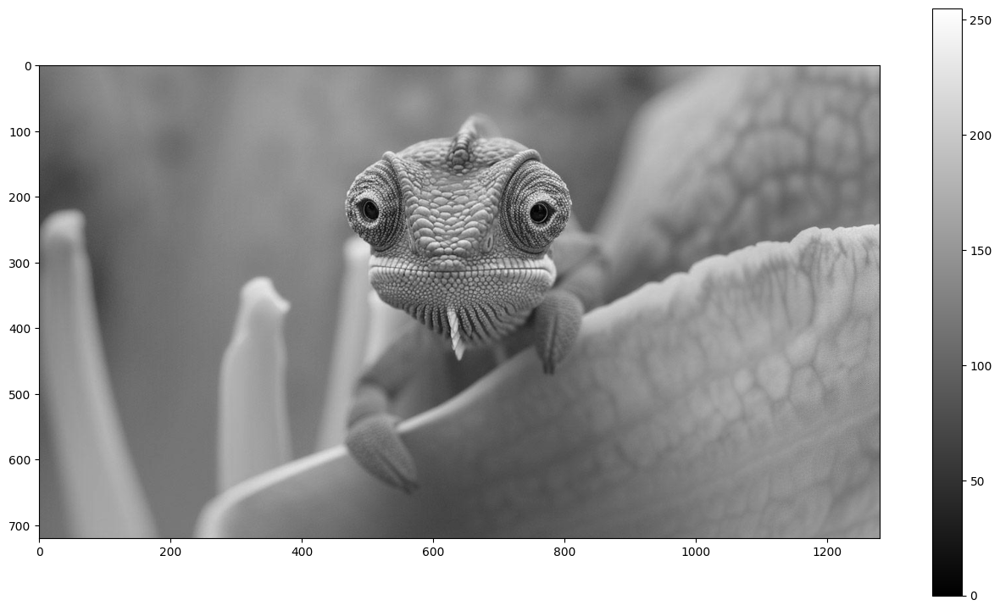

In [58]:
img = np.array(PIMG.open('cameleon.jpg'))
showImage(img)

**Q1**: Completez la fonction ci dessous, qui prend en paramètre une image (en niveau de gris) et un filtre (tous deux sous forme de `np.array`), et renvoie l'image obtenue en applicant la convolution du filtre et de l'image.
On supposera que le décalage (stride) est égal à 1, et qu'il n'y a pas de padding.


In [59]:
def convolution(img:np.ndarray, filtre:np.ndarray, zerosPadding:bool=False, verbose:bool=True)->np.ndarray:
    s0F, s1F = filtre.shape
    filtre = filtre.astype("float32")
    
    if zerosPadding is True:
        tmp = np.zeros((img.shape[0]+(s0F-1), img.shape[1]+(s1F-1)), dtype=img.dtype)
        xMid = (s0F-1) // 2
        yMid = (s0F-1) // 2
        tmp[xMid: tmp.shape[0]-(s0F-1-xMid), xMid: tmp.shape[1]-(s1F-1-xMid)] = img
        img = tmp
        del tmp, xMid, yMid
    s0, s1 = img.shape
    
    imgOut: np.ndarray = np.zeros((s0-(s0F-1), s1-(s1F-1)), dtype=np.float32)
    for xF in range(s0F):
        for yF in range(s1F):
            imgPortion = img[xF: s0-(s0F-xF)+1, yF: s1-(s1F-yF)+1]
            imgOut[:, :] += (filtre[xF, yF] * imgPortion)
    if verbose: 
        print(f"{imgOut.shape=} | (min, max)={(imgOut.min(), imgOut.max())}")
    return imgOut


On va maintenant utiliser cette fonction pour faire de la détection de contours dans notre image.
Pour cela, on va utiliser les [filtres de Sobel](https://fr.wikipedia.org/wiki/Filtre_de_Sobel) associés aux matrices $G_x$ et $G_y$, définies par:
$$G_x = \begin{pmatrix}-1 & 0 & 1 \\ -2 & 0 & 2\\-1 & 0 & 1 \\\end{pmatrix} \text{ et } G_y = \begin{pmatrix}-1 & -2 & -1 \\ 0 & 0 & 0\\1 & 2 & 1 \\\end{pmatrix}$$

**Q2**: Intuitivement, quel est l'effet du filtre $G_x$ sur l'image ? Et $G_y$ ?

> ils detectent les bordures dans la direction X et Y respectivement

**Q3**: Calculer les images $I_x$ et $I_y$ obtenues en faisant la convolution de l'image d'entrée avec $G_x$ et $G_y$.
Pour visualiser les contours, afficher l'image $I = abs(I_x) + abs(I_y)$. L'opération $abs$ correspond à la valeur absolue, i.e. la fonction `np.abs`.
Pour un meilleur résultat, on pourra limiter les valeurs à 255, en réduisant les valeurs au dessus à 255.

imgOut.shape=(3, 3) | (min, max)=(-4.0, 4.0)
[[-4.  0.  4.]
 [ 0.  0.  0.]
 [ 4.  0. -4.]]
imgOut.shape=(718, 1278) | (min, max)=(-677.0, 722.0)
imgOut.shape=(718, 1278) | (min, max)=(-668.0, 642.0)


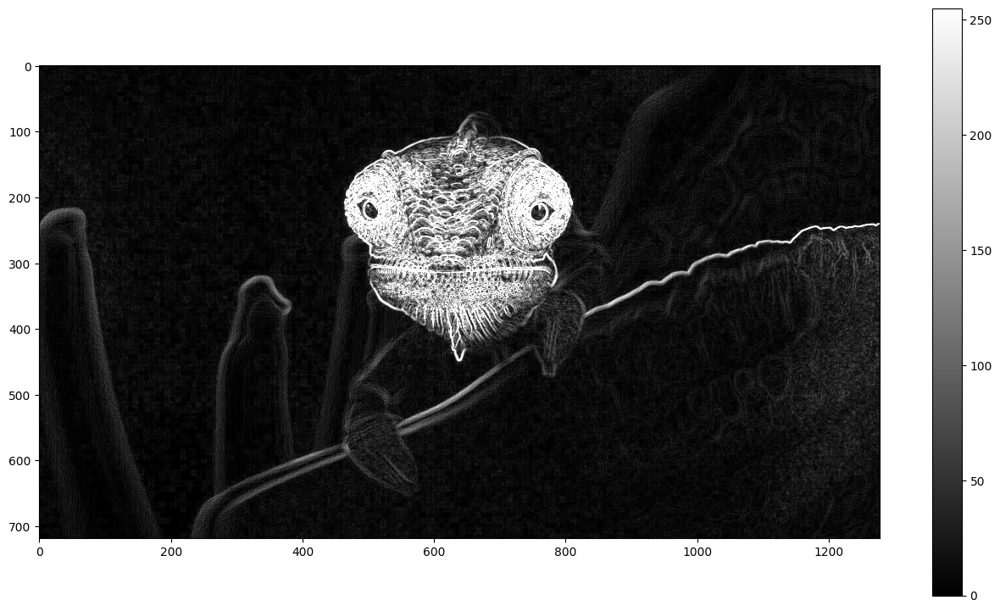

In [60]:
# showImage(convolution(img, getGaussianFilter2D(20)))
filtre_Gx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
filtre_Gy = filtre_Gx.T
filtre_G2 = convolution(filtre_Gx, filtre_Gy, zerosPadding=True)
print(filtre_G2)

#showImage(np.clip(convolution(img, filtre_Gy), 0, 255))
#showImage(np.clip(convolution(img, filtre_Gx), 0, 255))
#showImage(np.clip(convolution(img, filtre_G2), 0, 255))
showImage(np.abs(convolution(img, filtre_Gx)) + np.abs(convolution(img, filtre_Gy)), 0, 255)

## 2. Réseaux Convolutionnels pour la reconnaissance de chiffres

Dans la seconde partie du TP, nous allons comparer la performance de réseaux multilayer perceptron (MLP) à celle des réseaux convolutionnels pour un problème classique de classification d'images: reconnaître le chiffre dessiné sur une image.

In [61]:
import torch
import torch.nn.functional as F
import torchvision.datasets as ds
from torchvision import transforms

getDevice = lambda: torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = getDevice()
print(device)

cuda


Commençons par charger et visualiser les données.

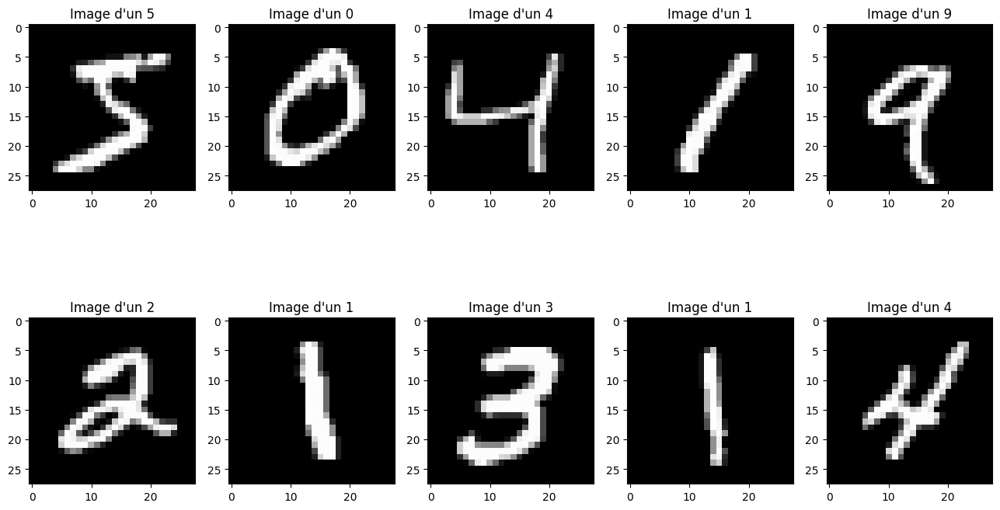

In [62]:
# Chargement et visualisation des données :
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((.5,), (.5,))
])
target_transform = lambda x: F.one_hot(torch.tensor(x, dtype=torch.long), num_classes=10).type(torch.float)
data_train = ds.MNIST(root="./data", train=True, transform=transform, target_transform=target_transform, download=False)
data_test = ds.MNIST(root="./data", train=False, transform=transform, target_transform=target_transform, download=False)


for i in range(10):
    plt.subplot(2,5,i+1)
    img = data_train.data[i, :, :]
    plt.title(f"Image d'un {data_train.targets[i]}")
    plt.imshow(img, cmap='gray')
plt.show()

In [63]:
data_train.data.shape, data_train.targets.shape

(torch.Size([60000, 28, 28]), torch.Size([60000]))

In [64]:
import torch.utils.data

batch_size = 256
train_loader = torch.utils.data.DataLoader(data_train, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=batch_size, shuffle=True)

train_datas: list[tuple[torch.Tensor, torch.Tensor]] = list(train_loader)
test_datas: list[tuple[torch.Tensor, torch.Tensor]] = list(test_loader)

Ensuite, on va entraîner un modèle avec des layers linéaires (dense). La définition du modèle est la suivante :

In [65]:
class MLP(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.layer1 = torch.nn.Linear(in_features=28*28, out_features=32)
        self.layer2 = torch.nn.Linear(in_features=32, out_features=10)

    def forward(self, x):
        # Flatten input
        x = x.view(-1, 28*28)
        x = torch.sigmoid(self.layer1(x))
        y = self.layer2(x)
        return y

In [66]:
from tqdm import tqdm

def validate(model, loss):
    with torch.no_grad():
        val_loss = 0
        nb_correct = 0
        for x, target in test_datas:
            x = x.to(device); target = target.to(device)
            output = model(x)
            val_loss += loss(output, target).item()
            nb_correct += sum(np.argmax(output.cpu(), axis=1) == np.argmax(target.cpu(), axis=1))
    return val_loss/len(data_test.data), nb_correct/len(data_test.data)

def train_epoch(model, optimizer, loss):
    train_loss = 0
    getter = iter(train_datas)
    while True:
        try: x, target = next(getter)
        except StopIteration: break
        x = x.to(device); target = target.to(device)
        optimizer.zero_grad()

        output = model(x)
        error = loss(output, target)

        error.backward()
        optimizer.step()

        train_loss += error.item()
    return train_loss / len(data_train.data)


In [67]:
from torch.optim import Adam
device = "cpu"
mlp = MLP().to(device)

# Optimizer
optimizer = Adam(mlp.parameters(), lr=0.001)

# Loss function
loss = torch.nn.CrossEntropyLoss()

# Number of epochs
num_epochs = 20

In [68]:
val_loss, prec = validate(mlp, loss)
print(f"Initial prec: {prec*100:.3f}%")
for e in range(num_epochs):
    train_loss = train_epoch(mlp, optimizer, loss)
    val_loss, prec = validate(mlp, loss)
    print(f"Epoch {e+1}: Train loss: {train_loss:.3g}, Val loss: {val_loss:.3g}, Val prec: {prec:.2%}")

Initial prec: 10.470%
Epoch 1: Train loss: 0.00477, Val loss: 0.00267, Val prec: 89.04%
Epoch 2: Train loss: 0.00206, Val loss: 0.00165, Val prec: 91.06%
Epoch 3: Train loss: 0.00148, Val loss: 0.00133, Val prec: 91.95%
Epoch 4: Train loss: 0.00125, Val loss: 0.00117, Val prec: 92.60%
Epoch 5: Train loss: 0.00111, Val loss: 0.00107, Val prec: 92.98%
Epoch 6: Train loss: 0.00101, Val loss: 0.000996, Val prec: 93.34%
Epoch 7: Train loss: 0.000934, Val loss: 0.000939, Val prec: 93.61%
Epoch 8: Train loss: 0.000872, Val loss: 0.000893, Val prec: 93.92%
Epoch 9: Train loss: 0.000821, Val loss: 0.000853, Val prec: 94.04%
Epoch 10: Train loss: 0.000776, Val loss: 0.000818, Val prec: 94.18%
Epoch 11: Train loss: 0.000737, Val loss: 0.000787, Val prec: 94.41%
Epoch 12: Train loss: 0.000702, Val loss: 0.00076, Val prec: 94.56%
Epoch 13: Train loss: 0.000671, Val loss: 0.000737, Val prec: 94.73%
Epoch 14: Train loss: 0.000643, Val loss: 0.000715, Val prec: 94.86%
Epoch 15: Train loss: 0.000618, V

**Q1**: En utilisant les layers [Conv2d](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html#torch.nn.Conv2d) et [MaxPool2d](https://pytorch.org/docs/stable/generated/torch.nn.MaxPool2d.html#torch.nn.MaxPool2d), créez une architecture convolutionnelle pour ce problème.

Vous avez le choix de la structure du réseau, mais, de manière générale, vous pouvez:
- alterner Conv2d et MaxPool2d
- Utiliser des filtres 3x3 ou 5x5, avec stride = 1 ou 2
- Utiliser les fonctions d'activation sigmoid ou relu après les couches Conv2d
- Vous aider de [ce site](https://asiltureli.github.io/Convolution-Layer-Calculator/) pour calculer la taille de la sortie de chaque couche,
- A la fin, aplatir l'image et appliquer un layer linéaire avec 10 neurones de sortie.

Vous pouvez par exemple vous inspirer de [l'architecture originale de LeNet de Yann LeCun](https://en.wikipedia.org/wiki/LeNet) (mais vous pouvez aussi faire mieux !).

In [69]:
class ConvNet(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.layers = torch.nn.Sequential(
            torch.nn.Conv2d(1, 8, kernel_size=(5, 5),  padding="valid", stride=1), # 8x24x24
            torch.nn.ReLU(), torch.nn.MaxPool2d(kernel_size=(2, 2), stride=2), # 8x12x12
            torch.nn.Conv2d(8, 16, kernel_size=(5, 5), padding="valid", stride=1), # 16x8x8
            torch.nn.Tanh(), torch.nn.MaxPool2d(kernel_size=(2, 2), stride=2), # 16x4x4
            torch.nn.Flatten(), # 256
            torch.nn.Linear(256, 96), torch.nn.ReLU(), # 96
            torch.nn.Linear(96, 64), torch.nn.Tanh(), # 64
            torch.nn.Linear(64, 10), # 10
        )
    
    def forward(self, x):
        return self.layers(x)

def test():
    model = ConvNet()
    NB_IMGS = 15
    i = 4644
    img = data_train.data[i: i+NB_IMGS].unsqueeze(1).to(torch.float32)
    print(f"{img.shape=}")
    y = model(img)
    assert y.shape == (NB_IMGS, 10)


test()

img.shape=torch.Size([15, 1, 28, 28])


**Q2**: entraînez votre modèle (indice: vous pouvez réutiliser en partie les fonctions définies ci-dessus!).

In [70]:
device = getDevice()
convNet = ConvNet().to(device)
convOptimizer = Adam(convNet.parameters(), lr=0.001)
loss = torch.nn.CrossEntropyLoss()

# Number of epochs
num_epochs = 10

val_loss, prec = validate(convNet, loss)
print(f"Initial prec: {prec*100:.3f}%")
for e in range(num_epochs):
    train_loss = train_epoch(convNet, convOptimizer, loss)
    val_loss, prec = validate(convNet, loss)
    print(f"Epoch {e+1}: Train loss: {train_loss:.3g}, Val loss: {val_loss:.3g}, Val prec: {prec:.2%}")
    
print()

Initial prec: 10.290%
Epoch 1: Train loss: 0.00198, Val loss: 0.000407, Val prec: 97.04%
Epoch 2: Train loss: 0.000319, Val loss: 0.000235, Val prec: 98.26%
Epoch 3: Train loss: 0.000205, Val loss: 0.000188, Val prec: 98.60%
Epoch 4: Train loss: 0.000156, Val loss: 0.000151, Val prec: 98.92%
Epoch 5: Train loss: 0.000124, Val loss: 0.00014, Val prec: 98.91%
Epoch 6: Train loss: 0.000101, Val loss: 0.00014, Val prec: 98.83%
Epoch 7: Train loss: 8.65e-05, Val loss: 0.000139, Val prec: 98.87%
Epoch 8: Train loss: 7.41e-05, Val loss: 0.000137, Val prec: 98.93%
Epoch 9: Train loss: 6.21e-05, Val loss: 0.000142, Val prec: 98.94%
Epoch 10: Train loss: 5.07e-05, Val loss: 0.00014, Val prec: 98.94%



**Q3**:
- Quelle précision obtenez-vous ?
- Votre modèle est-il plus performant que le MLP ?
- Est-il plus rapide à entraîner ?

> j'obtien une précision de 98.8 % sur la validation <br>
> il est bien plus performant que le MLP (93% pour le meme temps d'entrainement) <br>
> il est plus lent a entrainer (sur cpu Conv met 1.7s vs mlp 70ms) (avec cuda conv met 160ms, et mlp et plus lent sur cuda) <br>

**Q4 (Bonus)**: Trouvez une architecture qui fait au moins 97% de précision sur le test set.
> c'étais deja fait ! 

## 3. Generative Adversarial Networks (GANs).

Dans cette dernière partie, nous allons développer et entraîner un GAN sur le jeu de données MNIST, dans le but de générer des images "réalistes" de chiffres n'apparaissant pas dans les données d'entrainement.

In [71]:
from torch import nn
import torchvision.utils

On commence par définir les classes de Discriminator et de Generator. La class Generator, qui transforme du bruit en une image, est données ci-dessous.

In [72]:
class Generator(nn.Module):
    """Generator: (noise, classes) -> img\n
    noise of shape -1x100x1x1 and values in R normal(0, 1)\n
    classes of shape -1 and values in [0, 1])\n
    img of shape -1x1x28x28 and values in [-1, +1]"""
    NOISE_DIM: int = 100
    IMG_CHAN: int = 1
    IMG_SIZE: int = 28
    INPUT_NOISE_DIMS = (NOISE_DIM, 1, 1)
    OUTPUT_IMG_DIMS = (IMG_CHAN, IMG_SIZE, IMG_SIZE)
    NB_CLASSES: int = 10
    
    def __init__(self):
        super(Generator, self).__init__()
        
        
        self.main = nn.Sequential(
            # input layer
            nn.ConvTranspose2d(
                Generator.NOISE_DIM + Generator.NB_CLASSES,
                512, 5, 1, 0, bias=False),
            nn.BatchNorm2d(512), nn.ReLU(True),
            # 1st hidden layer
            nn.ConvTranspose2d(512, 256, 4, 1, 1, bias=False),
            nn.BatchNorm2d(256), nn.ReLU(True),
            # 2nd hidden layer
            nn.ConvTranspose2d(256, 128, 4, 1, 1, bias=False),
            nn.BatchNorm2d(128), nn.ReLU(True),
            # 3rd hidden layer
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64), nn.ReLU(True),
            # output layer
            nn.ConvTranspose2d(64, Generator.IMG_CHAN, 4, 2, 1, bias=False),
            nn.Tanh(),
        )

    def forward(self, noise:torch.Tensor, targets:torch.Tensor, verbose=False)->torch.Tensor:
        """noise of shape -1xINPUT_NOISE_DIMS | targets of shape -1xNB_CLASSES"""
        targets = (2*targets - 1).view(-1, 10, 1, 1)
        x = torch.cat([noise, targets], dim=1)
        if verbose: print(f"input is {x.shape}")
        i: int = 0
        for i, layer in enumerate(self.main):
            x = layer(x)
            if verbose: print(f"out of {i}-{layer._get_name()} is {'x'.join(map(str, x.shape[1: ]))}")
        return x

def test():
    model = Generator()
    BATCH_SIZE = 4
    targets = torch.empty((BATCH_SIZE, 10)).normal_()
    noises = torch.randn(BATCH_SIZE, *Generator.INPUT_NOISE_DIMS)
    y = model.forward(noises, targets, verbose=True)
    assert y.shape == (BATCH_SIZE, *Generator.OUTPUT_IMG_DIMS)

test()

input is torch.Size([4, 110, 1, 1])
out of 0-ConvTranspose2d is 512x5x5
out of 1-BatchNorm2d is 512x5x5
out of 2-ReLU is 512x5x5
out of 3-ConvTranspose2d is 256x6x6
out of 4-BatchNorm2d is 256x6x6
out of 5-ReLU is 256x6x6
out of 6-ConvTranspose2d is 128x7x7
out of 7-BatchNorm2d is 128x7x7
out of 8-ReLU is 128x7x7
out of 9-ConvTranspose2d is 64x14x14
out of 10-BatchNorm2d is 64x14x14
out of 11-ReLU is 64x14x14
out of 12-ConvTranspose2d is 1x28x28
out of 13-Tanh is 1x28x28


On peut générer et afficher une image avec ce générateur de la façon suivante:

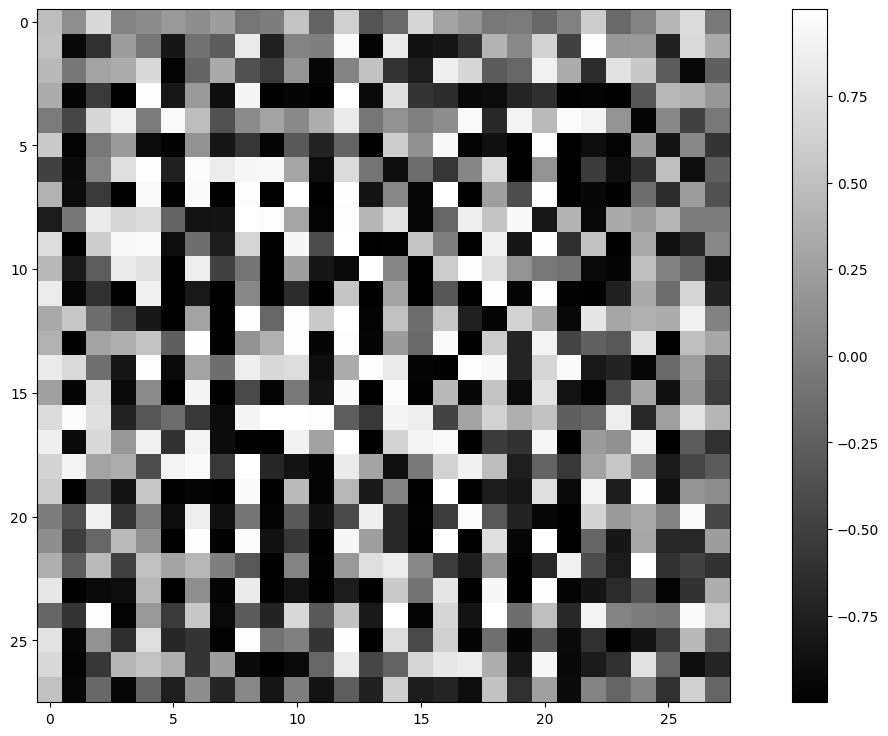

In [73]:
targets = torch.randn(1, Generator.NB_CLASSES, device=device).softmax(1).pow(0.01)
x = torch.randn(1, *Generator.INPUT_NOISE_DIMS, device=device)
gen = Generator()
gen.to(device) # Move the entire model to the device, including its parameters
img = gen(x, targets).detach().cpu().numpy()[0, 0, :, :]
print()
plt.imshow(img, cmap='gray')
plt.colorbar()

Pour l'instant, ces images ne ressemble pas à des chiffres. On verra plus tard comment elles vont évoluer au cours de l'entraînement.

Le Discriminator est un modèle de classification binaire, qui, étant donné une image, doit décider si elle provient du jeu de données (label 1), ou si c'est une création du Generator (label 0).

In [74]:
class Discriminator(nn.Module):
    """Discriminator: img -> (label, classes)\n
    img of shape -1x1x28x28 and values in [-1, +1]\n
    label of shape -1 and values in {0 fake, 1 real}\n
    classes of shape -1 and values in R (raw logits)"""
    NOISE_DIM: int = 100
    IMG_CHAN: int = Generator.IMG_CHAN
    IMG_SIZE: int = 28
    INPUT_IMG_DIMS = (IMG_CHAN, IMG_SIZE, IMG_SIZE)
    NB_CLASSES: int = Generator.NB_CLASSES
    
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # 1st layer
            nn.Conv2d(Discriminator.IMG_CHAN, 64, 4, 1, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # 2nd layer
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128), nn.LeakyReLU(0.2, inplace=True),
            # 3rd layer
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256), nn.LeakyReLU(0.2, inplace=True),
            # 4th layer
            nn.Conv2d(256, 128, 5, 1, 1, bias=False),
            nn.BatchNorm2d(128), nn.LeakyReLU(0.2, inplace=True),
            # output layer
            nn.Flatten(), # 2048
        )
        self.toLabel = nn.Sequential(
            nn.Linear(2048, 512), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 128), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, 1), nn.Sigmoid(),
        )
        self.toClasses = nn.Sequential(
            nn.Linear(2048, 512), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256), nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 10), # raw logits
        )

    def forward(self, imgs:torch.Tensor, verbose:bool=False)->tuple[torch.Tensor, torch.Tensor]:
        """img of shape -1x1x64x64"""
        if verbose: print(f"input is {imgs.shape}")
        # main part
        if verbose: print("main part")
        x = imgs 
        for i, layer in enumerate(self.main):
            x = layer(x)
            if verbose: print(f"out of {i}-{layer._get_name()} is {'x'.join(map(str, x.shape[1: ]))}")
        # classes part
        if verbose: print("toClasses part")
        classes = x
        for i, layer in enumerate(self.toClasses):
            classes = layer(classes)
            if verbose: print(f"out of {i}-{layer._get_name()} is {'x'.join(map(str, classes.shape[1: ]))}")
        # label part
        label = x
        if verbose: print("toLabel part")
        for i, layer in enumerate(self.toLabel):
            label = layer(label)
            if verbose: print(f"out of {i}-{layer._get_name()} is {'x'.join(map(str, label.shape[1: ]))}")
        return (label.squeeze(), classes)

def test():
    model = Generator()
    BATCH_SIZE = 4
    imgs = torch.randn(BATCH_SIZE, *Discriminator.INPUT_IMG_DIMS)
    model = Discriminator()
    (label, classes) = model.forward(imgs, verbose=True)
    assert label.shape == (BATCH_SIZE, )
    assert classes.shape == (BATCH_SIZE, Discriminator.NB_CLASSES)

test()



input is torch.Size([4, 1, 28, 28])
main part
out of 0-Conv2d is 64x27x27
out of 1-LeakyReLU is 64x27x27
out of 2-Conv2d is 128x13x13
out of 3-BatchNorm2d is 128x13x13
out of 4-LeakyReLU is 128x13x13
out of 5-Conv2d is 256x6x6
out of 6-BatchNorm2d is 256x6x6
out of 7-LeakyReLU is 256x6x6
out of 8-Conv2d is 128x4x4
out of 9-BatchNorm2d is 128x4x4
out of 10-LeakyReLU is 128x4x4
out of 11-Flatten is 2048
toClasses part
out of 0-Linear is 512
out of 1-LeakyReLU is 512
out of 2-Linear is 256
out of 3-LeakyReLU is 256
out of 4-Linear is 10
toLabel part
out of 0-Linear is 512
out of 1-LeakyReLU is 512
out of 2-Linear is 128
out of 3-LeakyReLU is 128
out of 4-Linear is 1
out of 5-Sigmoid is 1


In [75]:
# for logging batch results
import dataclasses

@dataclasses.dataclass(frozen=True)
class TrainBatchStepResults():
    epoch: int
    batch: int
    sizeOfBatch: int
    # correct labels
    discRealCorrectLabels: int
    discFakeCorrectLabels: int
    genCorrectLabels: int
    # correct classes
    discRealCorrectClasses: int
    discFakeCorrectClasses: int
    genCorrectClasses: int
    # labels losses
    discRealLabelLoss: float
    discFakeLabelLoss: float
    genLabelLoss: float
    # classes losses
    discRealClassesLoss: float
    discFakeClassesLoss: float
    genClassesLoss: float
    # stats on images
    realImgMean: float
    fakeImgMean: float
    realImgStd: float
    fakeImgStd: float

    @property
    def bSize(self)->int:
        return self.sizeOfBatch

    def toText(self, lastEpoch:int, nbBatchs:int)->str:
        return f"epoch n°{self.epoch+1}/{lastEpoch+1}, batch:{self.batch+1}/{nbBatchs} - " \
            f"lossLabels({self.discRealLabelLoss:.3g}, {self.discFakeLabelLoss:.3g}, {self.genLabelLoss:.3g}) - " \
            f"correctLabels({self.discRealCorrectLabels/self.bSize:.1%}, {self.discFakeCorrectLabels/self.bSize:.1%}, {self.genCorrectLabels/self.bSize:.1%}) - " \
            f"lossClasses({self.discRealClassesLoss:.3g}, {self.discFakeClassesLoss:.3g}, {self.genClassesLoss:.3g}) - " \
            f"correctClasses({self.discRealCorrectClasses/self.bSize:.1%}, {self.discFakeCorrectClasses/self.bSize:.1%}, {self.genCorrectClasses/self.bSize:.1%}) - " \
            f"mean({self.realImgMean:.3g}, {self.fakeImgMean:.3g}) - std({self.realImgStd:.3g}, {self.fakeImgStd:.3g})"
    
    @staticmethod
    def accumPerEpochStats(batchsResults:list["TrainBatchStepResults"])->"list[TrainBatchStepResults]":
        """acccumulate the results for batchs to results per epoch"""
        epochsGrps: dict[int, list[TrainBatchStepResults]] = {}
        for t in batchsResults:
            if t.epoch not in epochsGrps.keys():
                epochsGrps[t.epoch] = []
            epochsGrps[t.epoch].append(t)
        result: "list[TrainBatchStepResults]" = []
        for _, statsOfEpoch in sorted(epochsGrps.items()):
            result.append(TrainBatchStepResults.accumEpochResults(statsOfEpoch))
        return result
        
    
    @staticmethod
    def accumEpochResults(results:list["TrainBatchStepResults"])->"TrainBatchStepResults":
        """acccumulate the results for 1 epoch"""
        assert len(_ := set(t.epoch for t in results)) == 1, f"not the same epochs: {_}"
        batches = [t.batch for t in results]
        assert len(_ := {b for b in batches if batches.count(b)>1}) == 0, f"repeted batches: {_}"
        del batches
        # accumulate the results
        kwargs: dict[str, int|float] = {"epoch": results[0].epoch, "batch": -1, }
        kwargs["sizeOfBatch"] = sum(t.bSize for t in results)
        for kw in TrainBatchStepResults.__annotations__.keys():
            if kw in ("epoch", "batch", "sizeOfBatch"): continue
            elif kw.endswith("Loss") or "Img" in kw: # do weigthed avg
                kwargs[kw] = sum(t.__getattribute__(kw) * t.bSize for t in results)
                kwargs[kw] /= kwargs["sizeOfBatch"]
            elif "Correct" in kw: # summ the results
                kwargs[kw] = sum(t.__getattribute__(kw) for t in results)
            else: raise ValueError(f"unhandled {kw=}")
        return TrainBatchStepResults(**kwargs)
        
        
        

Le code suivant permet d'entraîner les deux réseaux.

# ATTENTION

Si votre ordinateur n'a pas de carte graphique, l'entraînement est **extremement** lent.
Dans ce cas, vous pouvez par exemple utiliser Google Colab, en vous connectant à un environnement GPU. 

In [76]:
device = getDevice()

# Create the generator and the discriminator
netG = Generator().to(device)
netD = Discriminator().to(device)

In [77]:
# Initialize BCELoss function
labelCriterion = nn.BCELoss()
ClassesCriterion = nn.CrossEntropyLoss()

# Create batch of latent vectors that I will use to visualize the progression of the generator
viz_targets = train_datas[0][1].to(device)
viz_noise = torch.randn(viz_targets.size(0), *Generator.INPUT_NOISE_DIMS, device=device)

# Setup Adam optimizers for both G and D
optimizerD = torch.optim.Adam(netD.parameters(), lr=5e-5, betas=(0.5, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=4e-4, betas=(0.5, 0.999))

In [78]:
def computeNbCorrectLabels(pred:torch.Tensor, truth:torch.Tensor)->int:
    return int(((pred.detach() >= 0.5) == truth.detach()).sum().cpu().item())

def computeNbCorrectClasses(pred:torch.Tensor, truth:torch.Tensor)->int:
    pred = pred.detach().argmax(dim=1)
    truth = truth.detach().argmax(dim=1)
    return int((pred == truth).sum().cpu().item())

In [79]:
def showImagesPan(batchImagesOutput:torch.Tensor, title:str|None=None, show:bool=True)->None:
    batchImagesOutput = batchImagesOutput[: 256]
    nrow = int(batchImagesOutput.size(0)**0.5)
    imagesPan = torchvision.utils.make_grid(
        batchImagesOutput.to(device), nrow=nrow, padding=2, normalize=True).cpu()
    plt.axis("off")
    if title is not None:
        plt.title(title)
    plt.imshow(np.transpose(imagesPan, (1,2,0)))
    if show is True: plt.show()

> les resultats des batches sont (sur les img reels | sur les img fake | aprés le train du discr lors du train du gen) <br>
> par exemple pour ...CorrectLabels (% de reel correctement labelisé | % de fake qui sont passé comme des vrais | % de fake qui sont passés comm des vrais)

Starting Training Loop...
torch.Size([256, 1, 28, 28])
epoch n°1/10, batch:1/235 - lossLabels(0.671, 0.714, 0.727) - correctLabels(82.4%, 22.7%, 12.5%) - lossClasses(2.31, 2.3, 2.28) - correctClasses(3.9%, 11.7%, 17.2%) - mean(-0.735, -0.157) - std(0.62, 0.781)


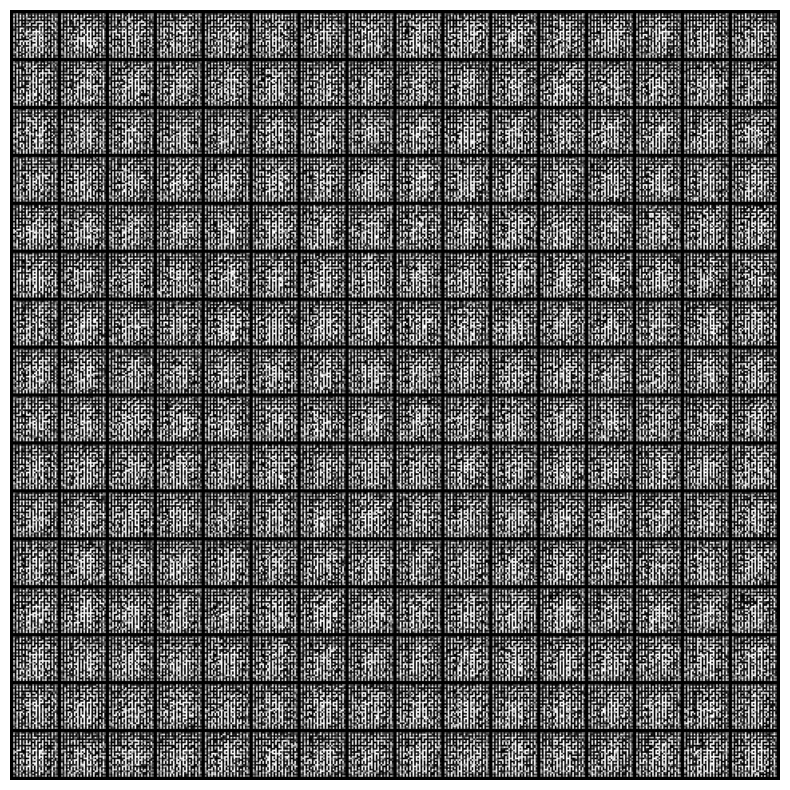

torch.Size([256, 1, 28, 28])
epoch n°1/10, batch:2/235 - lossLabels(0.616, 0.849, 0.639) - correctLabels(98.8%, 0.0%, 100.0%) - lossClasses(2.28, 2.3, 2.28) - correctClasses(14.5%, 10.9%, 16.8%) - mean(-0.742, -0.169) - std(0.613, 0.798)
torch.Size([256, 1, 28, 28])
epoch n°1/10, batch:3/235 - lossLabels(0.579, 0.875, 0.64) - correctLabels(100.0%, 0.0%, 100.0%) - lossClasses(2.25, 2.29, 2.28) - correctClasses(28.9%, 15.2%, 12.9%) - mean(-0.743, -0.174) - std(0.612, 0.799)
torch.Size([256, 1, 28, 28])
epoch n°1/10, batch:4/235 - lossLabels(0.558, 0.866, 0.66) - correctLabels(100.0%, 0.0%, 98.0%) - lossClasses(2.22, 2.28, 2.27) - correctClasses(43.0%, 16.4%, 19.5%) - mean(-0.741, -0.179) - std(0.613, 0.804)
torch.Size([256, 1, 28, 28])
epoch n°1/10, batch:5/235 - lossLabels(0.541, 0.877, 0.661) - correctLabels(100.0%, 0.0%, 99.2%) - lossClasses(2.19, 2.27, 2.26) - correctClasses(52.7%, 19.1%, 29.3%) - mean(-0.741, -0.191) - std(0.614, 0.81)
torch.Size([256, 1, 28, 28])
epoch n°1/10, batc

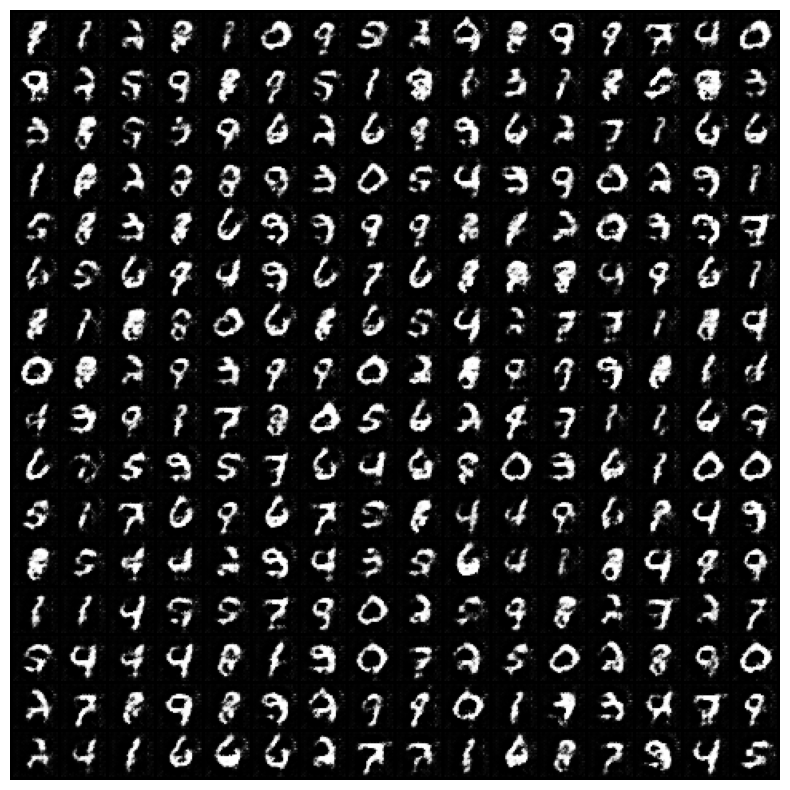

torch.Size([256, 1, 28, 28])
epoch n°2/10, batch:2/235 - lossLabels(0.659, 0.63, 1.01) - correctLabels(56.6%, 78.1%, 5.1%) - lossClasses(0.112, 0.0376, 0.0288) - correctClasses(97.3%, 99.6%, 99.6%) - mean(-0.742, -0.709) - std(0.613, 0.602)
torch.Size([256, 1, 28, 28])
epoch n°2/10, batch:3/235 - lossLabels(0.675, 0.675, 1.05) - correctLabels(53.9%, 65.6%, 2.3%) - lossClasses(0.169, 0.0846, 0.0536) - correctClasses(94.5%, 98.0%, 98.8%) - mean(-0.743, -0.71) - std(0.612, 0.596)
torch.Size([256, 1, 28, 28])
epoch n°2/10, batch:4/235 - lossLabels(0.709, 0.58, 0.949) - correctLabels(48.0%, 80.1%, 8.2%) - lossClasses(0.113, 0.0643, 0.0479) - correctClasses(98.0%, 98.8%, 99.6%) - mean(-0.741, -0.718) - std(0.613, 0.585)
torch.Size([256, 1, 28, 28])
epoch n°2/10, batch:5/235 - lossLabels(0.547, 0.707, 1.15) - correctLabels(76.2%, 51.6%, 0.0%) - lossClasses(0.0985, 0.054, 0.0402) - correctClasses(97.3%, 99.2%, 99.2%) - mean(-0.741, -0.723) - std(0.614, 0.579)
torch.Size([256, 1, 28, 28])
epoch

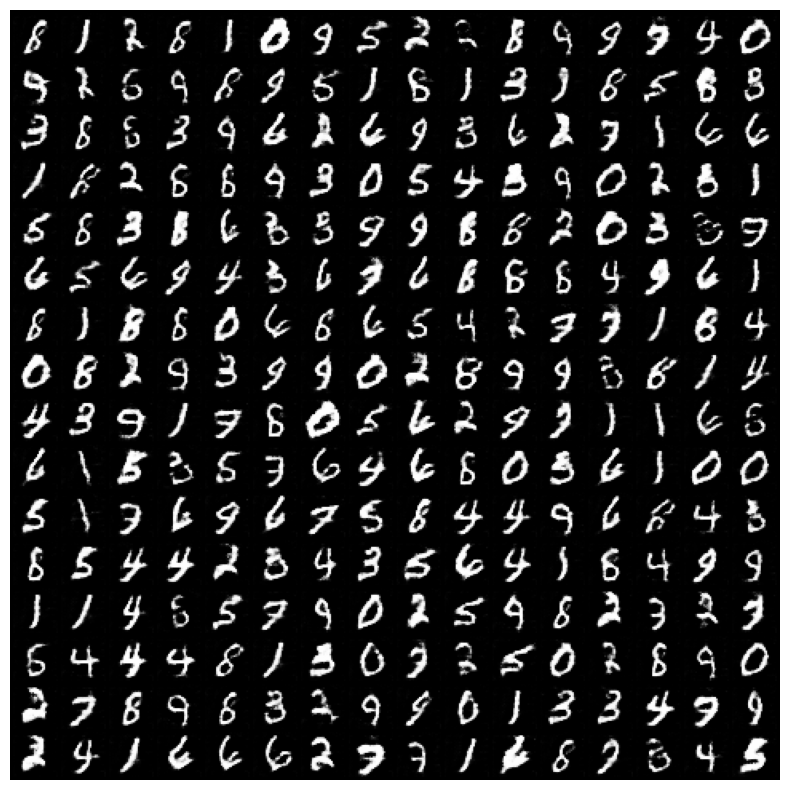

torch.Size([256, 1, 28, 28])
epoch n°3/10, batch:2/235 - lossLabels(0.637, 0.709, 1.13) - correctLabels(62.1%, 50.4%, 0.4%) - lossClasses(0.0523, 0.0648, 0.0554) - correctClasses(98.4%, 98.8%, 98.8%) - mean(-0.742, -0.725) - std(0.613, 0.617)
torch.Size([256, 1, 28, 28])
epoch n°3/10, batch:3/235 - lossLabels(0.886, 0.467, 0.476) - correctLabels(18.0%, 99.2%, 95.7%) - lossClasses(0.102, 0.0102, 0.00833) - correctClasses(97.3%, 100.0%, 100.0%) - mean(-0.743, -0.73) - std(0.612, 0.613)
torch.Size([256, 1, 28, 28])
epoch n°3/10, batch:4/235 - lossLabels(0.33, 1.14, 1.61) - correctLabels(99.6%, 0.8%, 0.0%) - lossClasses(0.0557, 0.00537, 0.0104) - correctClasses(98.4%, 100.0%, 100.0%) - mean(-0.741, -0.735) - std(0.613, 0.608)
torch.Size([256, 1, 28, 28])
epoch n°3/10, batch:5/235 - lossLabels(1.42, 0.28, 1.25) - correctLabels(0.4%, 99.2%, 1.2%) - lossClasses(0.0478, 0.016, 0.0127) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.741, -0.738) - std(0.614, 0.602)
torch.Size([256, 1, 28, 28]

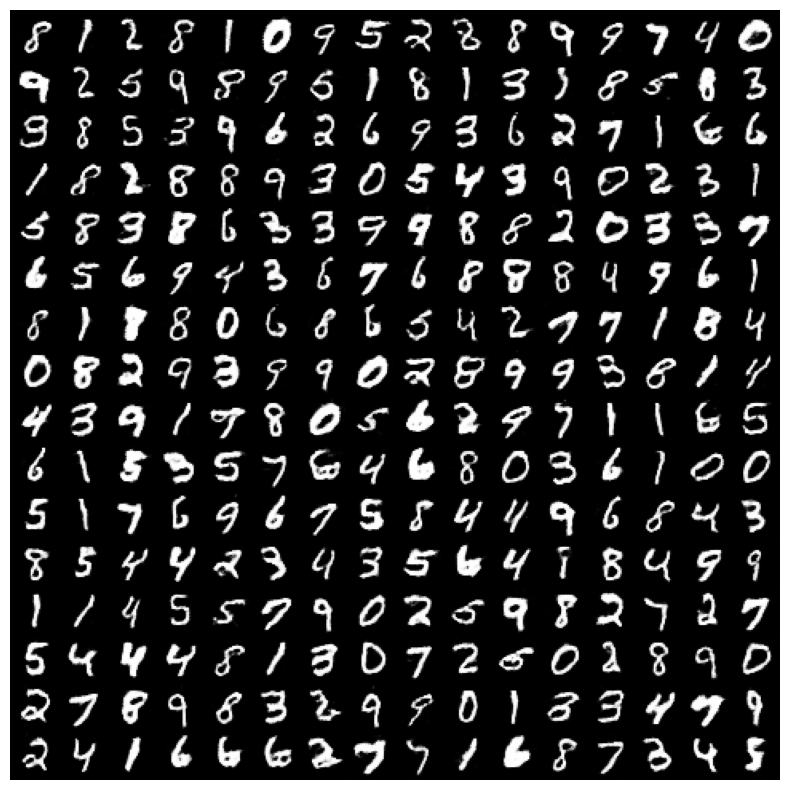

torch.Size([256, 1, 28, 28])
epoch n°4/10, batch:2/235 - lossLabels(0.635, 0.643, 0.773) - correctLabels(62.9%, 71.5%, 28.5%) - lossClasses(0.0447, 0.0101, 0.00892) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.742, -0.704) - std(0.613, 0.65)
torch.Size([256, 1, 28, 28])
epoch n°4/10, batch:3/235 - lossLabels(0.605, 0.688, 0.841) - correctLabels(73.0%, 57.0%, 13.3%) - lossClasses(0.0712, 0.0128, 0.0104) - correctClasses(98.0%, 99.6%, 99.6%) - mean(-0.743, -0.721) - std(0.612, 0.631)
torch.Size([256, 1, 28, 28])
epoch n°4/10, batch:4/235 - lossLabels(0.636, 0.668, 0.873) - correctLabels(66.0%, 60.2%, 13.3%) - lossClasses(0.0351, 0.037, 0.0165) - correctClasses(98.8%, 98.8%, 99.2%) - mean(-0.741, -0.739) - std(0.613, 0.613)
torch.Size([256, 1, 28, 28])
epoch n°4/10, batch:5/235 - lossLabels(0.75, 0.619, 0.78) - correctLabels(38.3%, 73.8%, 27.3%) - lossClasses(0.0247, 0.00945, 0.0058) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.741, -0.754) - std(0.614, 0.596)
torch.Size([256, 1

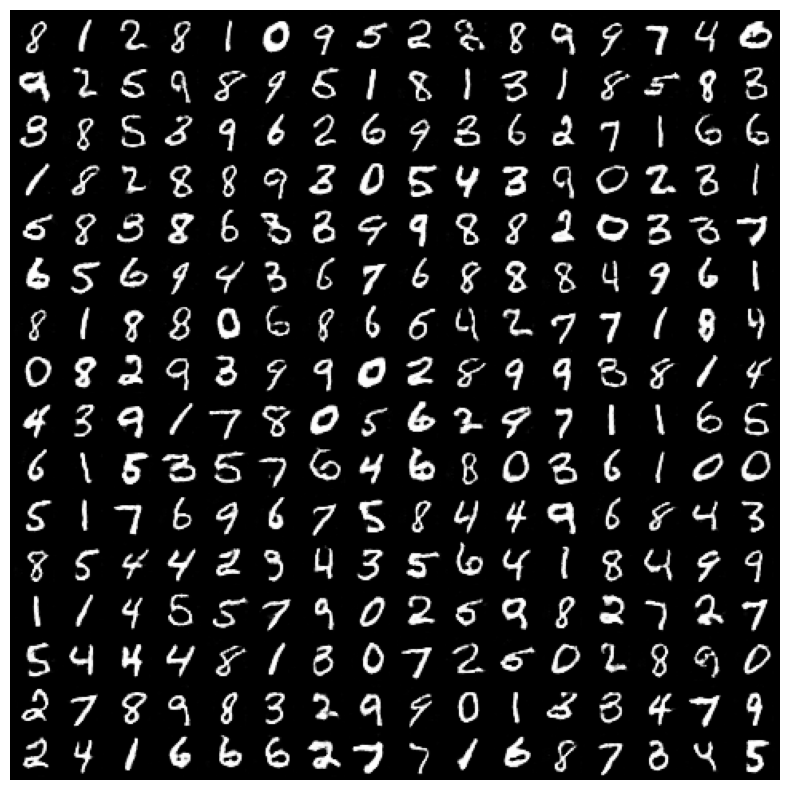

torch.Size([256, 1, 28, 28])
epoch n°5/10, batch:2/235 - lossLabels(0.639, 0.728, 0.884) - correctLabels(63.3%, 45.3%, 6.6%) - lossClasses(0.0498, 0.003, 0.00252) - correctClasses(98.8%, 100.0%, 100.0%) - mean(-0.742, -0.748) - std(0.613, 0.606)
torch.Size([256, 1, 28, 28])
epoch n°5/10, batch:3/235 - lossLabels(0.797, 0.578, 0.767) - correctLabels(22.7%, 87.9%, 32.4%) - lossClasses(0.0599, 0.00373, 0.0041) - correctClasses(98.4%, 100.0%, 100.0%) - mean(-0.743, -0.759) - std(0.612, 0.592)
torch.Size([256, 1, 28, 28])
epoch n°5/10, batch:4/235 - lossLabels(0.658, 0.686, 0.788) - correctLabels(63.7%, 54.7%, 26.6%) - lossClasses(0.0264, 0.00492, 0.00459) - correctClasses(98.8%, 100.0%, 100.0%) - mean(-0.741, -0.761) - std(0.613, 0.59)
torch.Size([256, 1, 28, 28])
epoch n°5/10, batch:5/235 - lossLabels(0.693, 0.676, 0.825) - correctLabels(50.8%, 57.0%, 13.3%) - lossClasses(0.0206, 0.00419, 0.00329) - correctClasses(99.6%, 100.0%, 100.0%) - mean(-0.741, -0.766) - std(0.614, 0.584)
torch.Siz

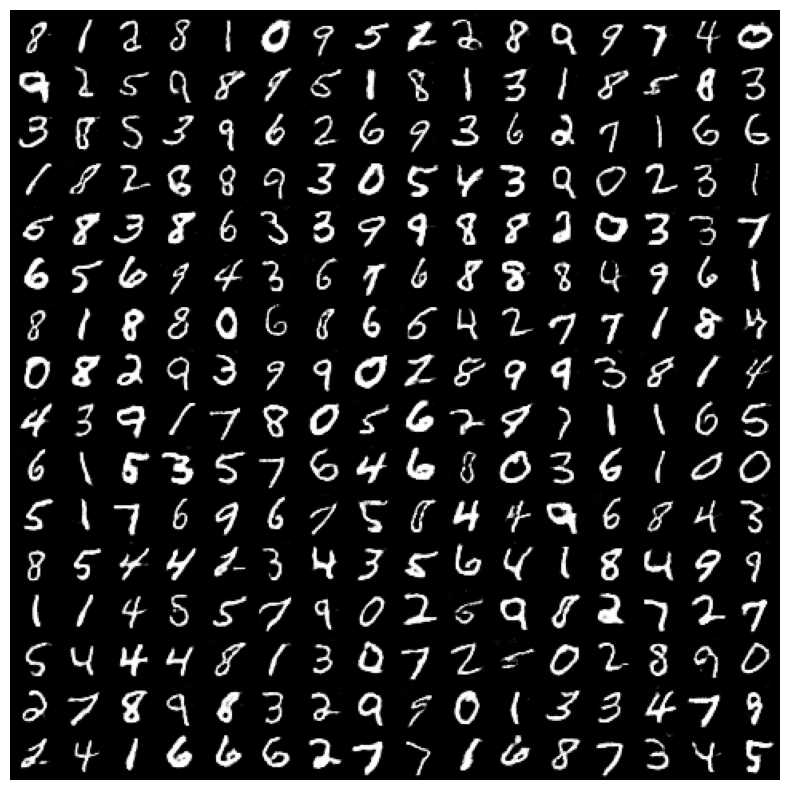

torch.Size([256, 1, 28, 28])
epoch n°6/10, batch:2/235 - lossLabels(0.634, 0.698, 0.734) - correctLabels(68.4%, 52.0%, 39.8%) - lossClasses(0.0314, 0.0117, 0.00667) - correctClasses(98.8%, 100.0%, 100.0%) - mean(-0.742, -0.749) - std(0.613, 0.603)
torch.Size([256, 1, 28, 28])
epoch n°6/10, batch:3/235 - lossLabels(0.633, 0.75, 0.816) - correctLabels(69.9%, 38.3%, 18.4%) - lossClasses(0.0525, 0.0058, 0.00483) - correctClasses(98.0%, 100.0%, 100.0%) - mean(-0.743, -0.759) - std(0.612, 0.593)
torch.Size([256, 1, 28, 28])
epoch n°6/10, batch:4/235 - lossLabels(0.711, 0.626, 0.745) - correctLabels(44.1%, 76.6%, 37.9%) - lossClasses(0.025, 0.00155, 0.00157) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.741, -0.751) - std(0.613, 0.603)
torch.Size([256, 1, 28, 28])
epoch n°6/10, batch:5/235 - lossLabels(0.64, 0.701, 0.783) - correctLabels(70.3%, 43.0%, 29.7%) - lossClasses(0.0192, 0.00173, 0.00154) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.741, -0.745) - std(0.614, 0.61)
torch.Size

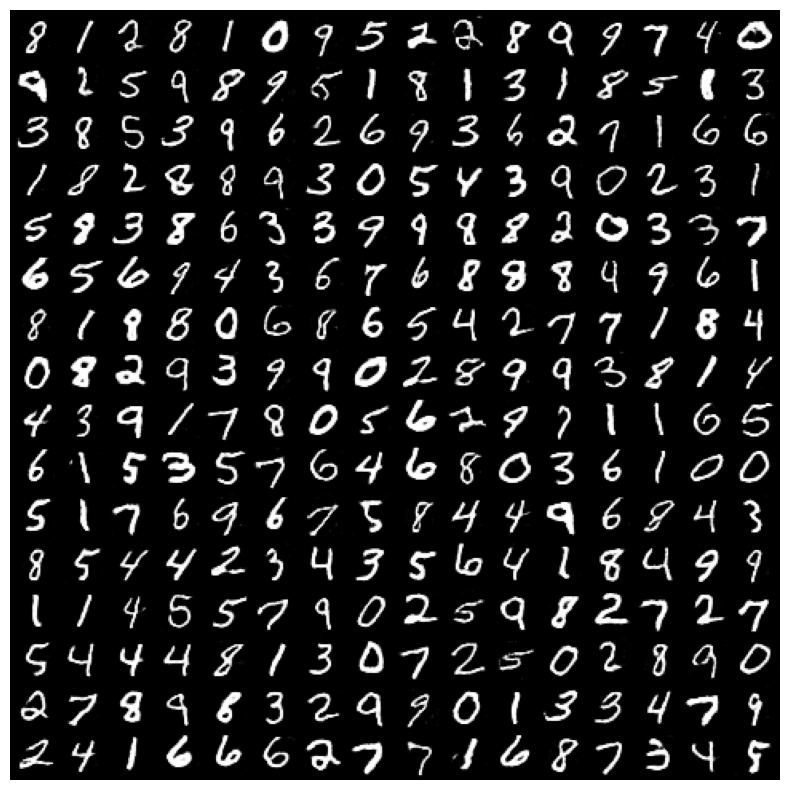

torch.Size([256, 1, 28, 28])
epoch n°7/10, batch:2/235 - lossLabels(0.702, 0.653, 0.775) - correctLabels(47.7%, 66.0%, 27.0%) - lossClasses(0.0216, 0.00485, 0.00297) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.742, -0.748) - std(0.613, 0.605)
torch.Size([256, 1, 28, 28])
epoch n°7/10, batch:3/235 - lossLabels(0.701, 0.653, 0.694) - correctLabels(48.4%, 62.9%, 54.3%) - lossClasses(0.0298, 0.00129, 0.00119) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.743, -0.75) - std(0.612, 0.603)
torch.Size([256, 1, 28, 28])
epoch n°7/10, batch:4/235 - lossLabels(0.58, 0.74, 0.892) - correctLabels(80.9%, 41.8%, 3.9%) - lossClasses(0.0117, 0.00634, 0.0038) - correctClasses(99.6%, 99.6%, 100.0%) - mean(-0.741, -0.741) - std(0.613, 0.611)
torch.Size([256, 1, 28, 28])
epoch n°7/10, batch:5/235 - lossLabels(0.777, 0.591, 0.784) - correctLabels(23.8%, 86.7%, 18.0%) - lossClasses(0.0167, 0.0015, 0.00122) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.741, -0.741) - std(0.614, 0.608)
torch.Size(

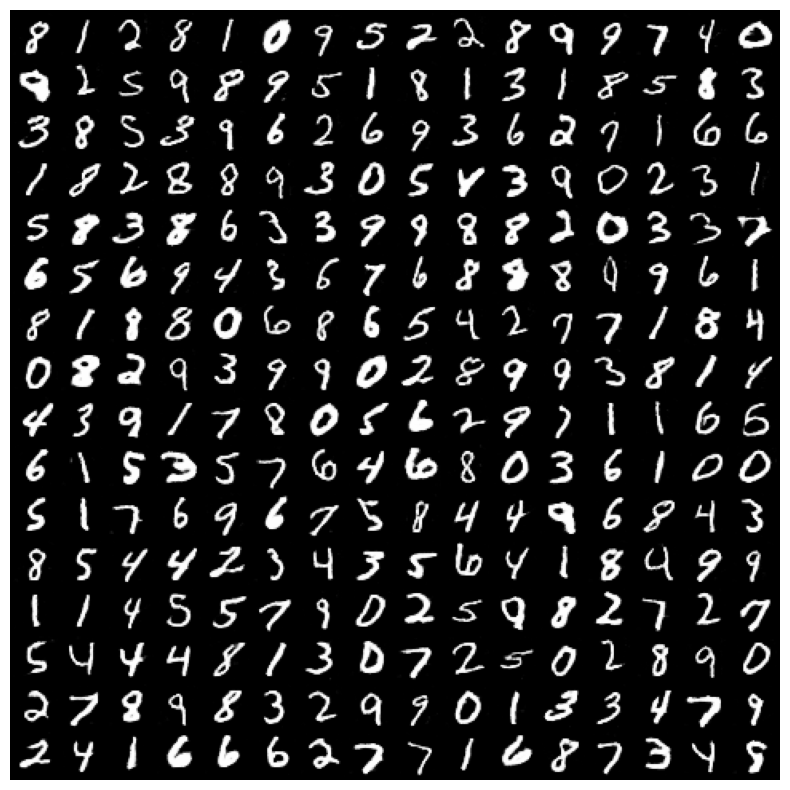

torch.Size([256, 1, 28, 28])
epoch n°8/10, batch:2/235 - lossLabels(0.669, 0.631, 0.673) - correctLabels(58.6%, 71.9%, 55.9%) - lossClasses(0.0233, 0.00151, 0.00145) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.742, -0.727) - std(0.613, 0.63)
torch.Size([256, 1, 28, 28])
epoch n°8/10, batch:3/235 - lossLabels(0.52, 0.855, 0.987) - correctLabels(86.7%, 19.1%, 2.7%) - lossClasses(0.0206, 0.0062, 0.00626) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.743, -0.724) - std(0.612, 0.629)
torch.Size([256, 1, 28, 28])
epoch n°8/10, batch:4/235 - lossLabels(0.876, 0.49, 0.905) - correctLabels(13.7%, 94.1%, 11.3%) - lossClasses(0.0122, 0.0036, 0.00328) - correctClasses(100.0%, 100.0%, 100.0%) - mean(-0.741, -0.723) - std(0.613, 0.627)
torch.Size([256, 1, 28, 28])
epoch n°8/10, batch:5/235 - lossLabels(0.8, 0.582, 0.715) - correctLabels(26.6%, 83.2%, 47.3%) - lossClasses(0.0087, 0.00446, 0.00274) - correctClasses(100.0%, 100.0%, 100.0%) - mean(-0.741, -0.725) - std(0.614, 0.625)
torch.Size

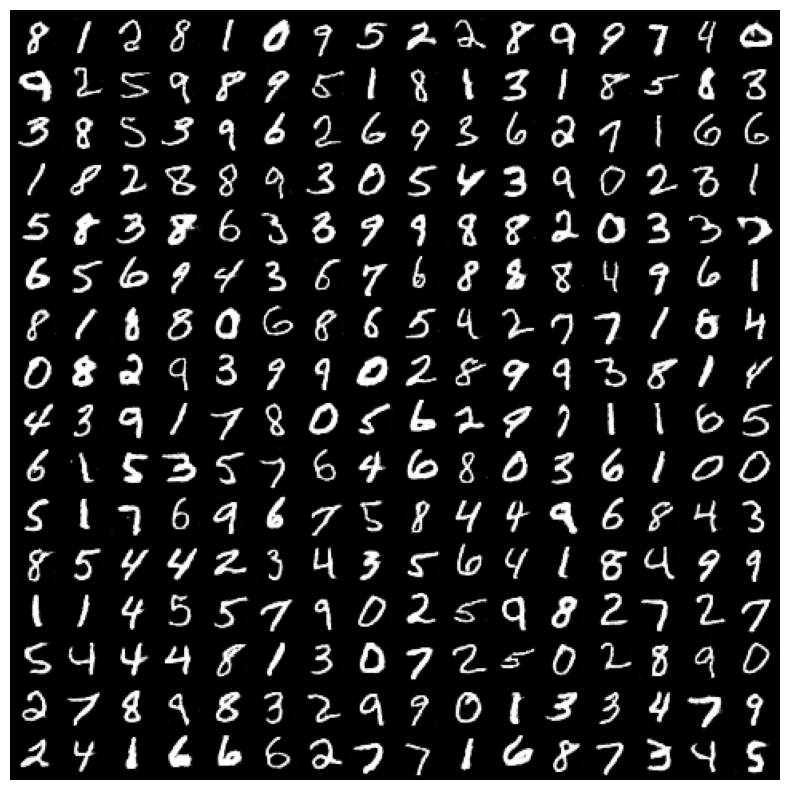

torch.Size([256, 1, 28, 28])
epoch n°9/10, batch:2/235 - lossLabels(0.578, 0.743, 0.954) - correctLabels(80.9%, 44.5%, 3.9%) - lossClasses(0.021, 0.00169, 0.00199) - correctClasses(98.8%, 100.0%, 100.0%) - mean(-0.742, -0.738) - std(0.613, 0.615)
torch.Size([256, 1, 28, 28])
epoch n°9/10, batch:3/235 - lossLabels(0.808, 0.541, 0.731) - correctLabels(20.3%, 90.6%, 42.2%) - lossClasses(0.0149, 0.0109, 0.0027) - correctClasses(100.0%, 99.6%, 100.0%) - mean(-0.743, -0.75) - std(0.612, 0.6)
torch.Size([256, 1, 28, 28])
epoch n°9/10, batch:4/235 - lossLabels(0.611, 0.703, 0.746) - correctLabels(68.0%, 51.2%, 36.3%) - lossClasses(0.00858, 0.00215, 0.00149) - correctClasses(100.0%, 100.0%, 100.0%) - mean(-0.741, -0.752) - std(0.613, 0.599)
torch.Size([256, 1, 28, 28])
epoch n°9/10, batch:5/235 - lossLabels(0.651, 0.712, 0.835) - correctLabels(63.7%, 46.1%, 17.2%) - lossClasses(0.005, 0.00146, 0.00131) - correctClasses(100.0%, 100.0%, 100.0%) - mean(-0.741, -0.753) - std(0.614, 0.598)
torch.Siz

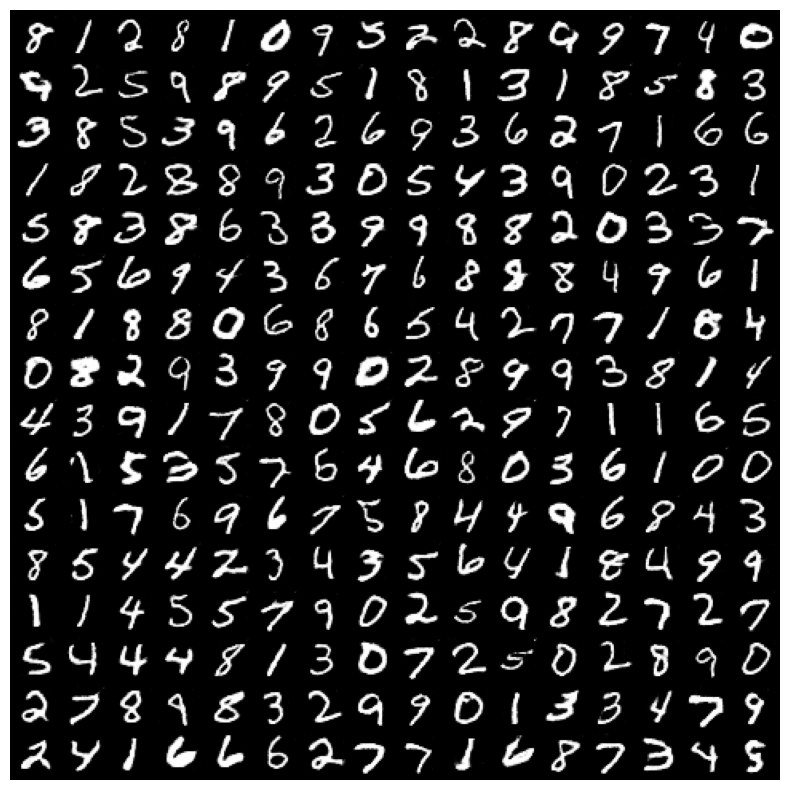

torch.Size([256, 1, 28, 28])
epoch n°10/10, batch:2/235 - lossLabels(0.834, 0.505, 0.842) - correctLabels(19.9%, 95.7%, 20.7%) - lossClasses(0.0213, 0.00153, 0.00118) - correctClasses(99.2%, 100.0%, 100.0%) - mean(-0.742, -0.73) - std(0.613, 0.626)
torch.Size([256, 1, 28, 28])
epoch n°10/10, batch:3/235 - lossLabels(0.683, 0.611, 0.622) - correctLabels(51.2%, 75.4%, 73.8%) - lossClasses(0.0105, 0.016, 0.00107) - correctClasses(99.6%, 99.6%, 100.0%) - mean(-0.743, -0.733) - std(0.612, 0.62)
torch.Size([256, 1, 28, 28])
epoch n°10/10, batch:4/235 - lossLabels(0.467, 0.864, 0.884) - correctLabels(96.1%, 16.8%, 9.0%) - lossClasses(0.00884, 0.00207, 0.00234) - correctClasses(99.6%, 100.0%, 100.0%) - mean(-0.741, -0.737) - std(0.613, 0.614)
torch.Size([256, 1, 28, 28])
epoch n°10/10, batch:5/235 - lossLabels(0.749, 0.577, 0.836) - correctLabels(36.7%, 87.1%, 18.4%) - lossClasses(0.00672, 0.00107, 0.000672) - correctClasses(100.0%, 100.0%, 100.0%) - mean(-0.741, -0.739) - std(0.614, 0.615)
to

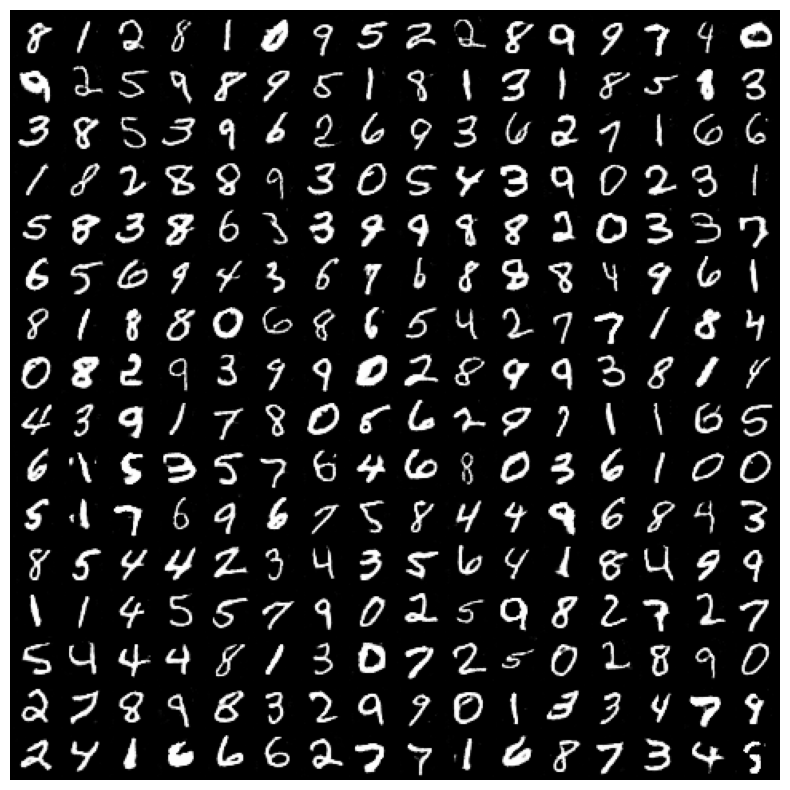

In [80]:
# Training Loop
NB_EPOCHES_TO_DO = 10
lastEpoch = (NB_EPOCHES_TO_DO - 1)


batchesStats: list[TrainBatchStepResults] = []

print("Starting Training Loop...")
for epoch in range(0, NB_EPOCHES_TO_DO):
    
    for batch, (images, targets) in enumerate(train_datas, 0):
        targets = targets.to(device)
        
        # (1) Update the discriminator with real data
        netD.zero_grad()
        # Format batch
        realImages = images.to(device)
        print(realImages.shape)
        sizeOfBatch = realImages.size(0)
        discRealTrueLabel = torch.full((sizeOfBatch, ), 1, dtype=torch.float, device=device)
        # Forward pass real batch through D
        (discRealPredLabel, discRealPredClasses) = netD(realImages)
        # Calculate loss on all-real batch
        discRealLabelLoss = labelCriterion(discRealPredLabel, discRealTrueLabel)
        discRealClassesLoss = ClassesCriterion(discRealPredClasses, targets)
        # Calculate gradients for D in backward pass
        discRealLabelLoss.backward(retain_graph=True)
        discRealClassesLoss.backward()
        # Compute the correct predictions of D for the real batche
        discRealCorrectLabels = computeNbCorrectLabels(discRealPredLabel, discRealTrueLabel)
        discRealCorrectClasses = computeNbCorrectClasses(discRealPredClasses, targets)
        # print(f"discRealCorrectLabels={discRealCorrectLabels/sizeOfBatch:.1%}, discRealCorrectClasses={discRealCorrectClasses/sizeOfBatch:.2%}")
        
        # (2) Update the discriminator with fake data
        # Generate batch of latent vectors
        noise = torch.randn(sizeOfBatch, *Generator.INPUT_NOISE_DIMS, device=device)
        # Generate fake image batch with G
        fakeImages = netG(noise, targets)
        discFakeTrueLabel = torch.full((sizeOfBatch, ), 0, dtype=torch.float, device=device)
        # Classify all fake batch with D
        (discFakePredLabel, discFakePredClasses) = netD(fakeImages.detach())
        # Calculate loss on all-fake batch (maybe no loss on classes for the fake batch ?)
        discFakeLabelLoss = labelCriterion(discFakePredLabel, discFakeTrueLabel)
        discFakeClassesLoss = ClassesCriterion(discFakePredClasses, targets)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        discFakeLabelLoss.backward(retain_graph=True)
        discFakeClassesLoss.backward()
        # Compute the correct predictions of D for the real batch
        discFakeCorrectLabels = computeNbCorrectLabels(discFakePredLabel, discFakeTrueLabel)
        discFakeCorrectClasses = computeNbCorrectClasses(discFakePredClasses, targets)
        # print(f"discFakeCorrectLabels={discFakeCorrectLabels/sizeOfBatch:.1%}, discFakeCorrectClasses={discFakeCorrectClasses/sizeOfBatch:.2%}")
        # Update D
        optimizerD.step()
        
        # (3) Update the generator with fake data
        netG.zero_grad()
        # fake labels are real for generator cost
        genTrueLabel = torch.full((sizeOfBatch, ), 1, dtype=torch.float, device=device) 
        # Since we just updated D, perform another forward pass of all-fake batch through D
        (genPredLabel, genPredClasses) = netD(fakeImages)
        # Calculate G's loss based on this output
        genLabelLoss = labelCriterion(genPredLabel, genTrueLabel)
        genClassesLoss = ClassesCriterion(genPredClasses, targets)
        # Calculate gradients for G in backward pass
        genLabelLoss.backward(retain_graph=True)
        genClassesLoss.backward()
        # Compute the correct predictions of D for the fake batche after D's update
        genCorrectLabels = computeNbCorrectLabels(genPredLabel, genTrueLabel)
        genCorrectClasses = computeNbCorrectClasses(genPredClasses, targets)
        # print(f"genCorrectLabels={genCorrectLabels/sizeOfBatch:.1%}, genCorrectClasses={genCorrectClasses/sizeOfBatch:.2%}")
        # Update G
        optimizerG.step()
        
        batchesStats.append(TrainBatchStepResults(
            epoch, batch, sizeOfBatch,
            discRealCorrectLabels, discFakeCorrectLabels, genCorrectLabels,
            discRealCorrectClasses, discFakeCorrectClasses, genCorrectClasses, 
            discRealLabelLoss.item(), discFakeLabelLoss.item(), genLabelLoss.item(), 
            discRealClassesLoss.item(), discFakeClassesLoss.item(), genClassesLoss.item(),
            realImages.mean().item(), fakeImages.mean().item(), 
            realImages.std().item(), fakeImages.std().item(), ))
        
        # Output training stats
        print(batchesStats[-1].toText(lastEpoch=lastEpoch, nbBatchs=len(train_datas)))
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (batch == 0) or (((epoch == lastEpoch) and (batch == len(train_datas)-1))):
            with torch.no_grad():
                viz_fakeImages = netG(viz_noise, viz_targets).detach()
            plt.figure(figsize=(10,10))
            showImagesPan(viz_fakeImages)


In [85]:
epochsStats = TrainBatchStepResults.accumPerEpochStats(batchesStats)
print(*map(lambda t: t.toText(epochsStats[-1].epoch, 0), epochsStats), sep="\n")

epoch n°1/10, batch:0/0 - lossLabels(0.649, 0.666, 0.906) - correctLabels(62.0%, 62.7%, 4.5%) - lossClasses(0.519, 0.278, 0.262) - correctClasses(88.1%, 94.9%, 95.5%) - mean(-0.739, -0.663) - std(0.616, 0.592)
epoch n°2/10, batch:0/0 - lossLabels(0.66, 0.643, 0.911) - correctLabels(58.3%, 66.6%, 14.9%) - lossClasses(0.108, 0.0237, 0.0185) - correctClasses(96.7%, 99.7%, 99.8%) - mean(-0.739, -0.725) - std(0.616, 0.6)
epoch n°3/10, batch:0/0 - lossLabels(0.671, 0.656, 0.858) - correctLabels(56.2%, 64.1%, 19.7%) - lossClasses(0.0634, 0.0107, 0.00854) - correctClasses(98.1%, 99.8%, 99.9%) - mean(-0.739, -0.735) - std(0.616, 0.612)
epoch n°4/10, batch:0/0 - lossLabels(0.669, 0.658, 0.84) - correctLabels(56.1%, 63.2%, 21.3%) - lossClasses(0.0467, 0.00904, 0.00651) - correctClasses(98.6%, 99.8%, 99.9%) - mean(-0.739, -0.737) - std(0.616, 0.615)
epoch n°5/10, batch:0/0 - lossLabels(0.675, 0.668, 0.8) - correctLabels(54.8%, 60.7%, 26.0%) - lossClasses(0.0361, 0.00634, 0.00432) - correctClasses(

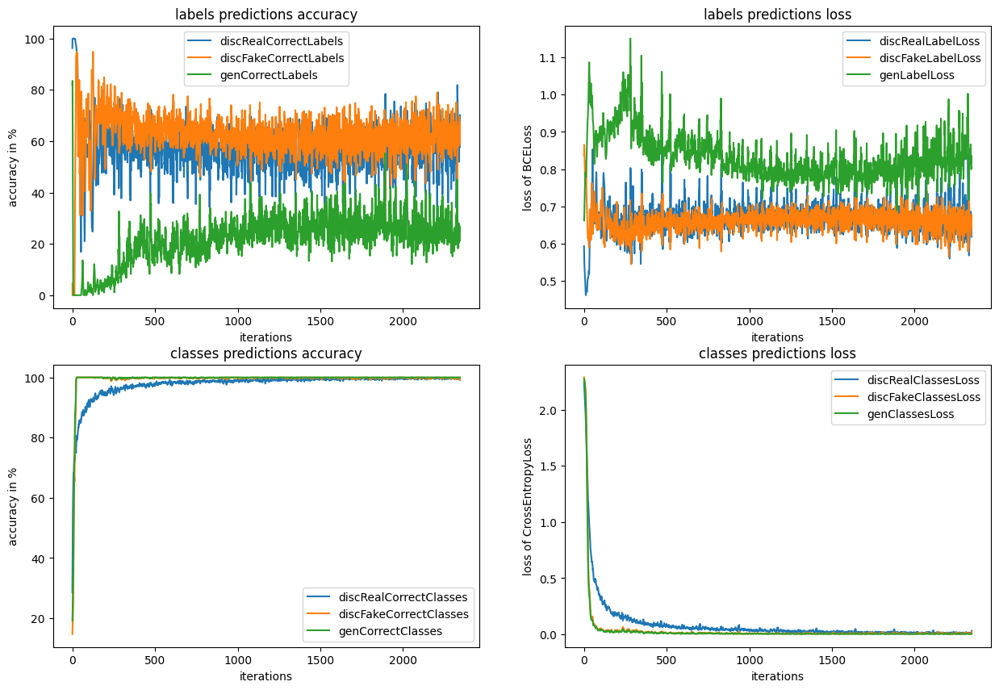

In [86]:
def smooth(y:np.ndarray|list[float]):
    box_pts: int = 5
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, "valid")
    return y_smooth

plt.figure(figsize=(15, 10))


plt.subplot(2,2,1)
plt.title("labels predictions accuracy")
plt.xlabel("iterations")
plt.ylabel(rf"accuracy in %")
plt.plot(smooth([100*batchStat.discRealCorrectLabels/batchStat.bSize for batchStat in batchesStats]), label="discRealCorrectLabels")
plt.plot(smooth([100*batchStat.discFakeCorrectLabels/batchStat.bSize for batchStat in batchesStats]), label="discFakeCorrectLabels")
plt.plot(smooth([100*batchStat.genCorrectLabels/batchStat.bSize for batchStat in batchesStats]), label="genCorrectLabels")
plt.legend()

plt.subplot(2,2,2)
plt.title("labels predictions loss")
plt.xlabel("iterations")
plt.ylabel(rf"loss of {labelCriterion._get_name()}")
plt.plot(smooth([batchStat.discRealLabelLoss for batchStat in batchesStats]), label="discRealLabelLoss")
plt.plot(smooth([batchStat.discFakeLabelLoss for batchStat in batchesStats]), label="discFakeLabelLoss")
plt.plot(smooth([batchStat.genLabelLoss for batchStat in batchesStats]), label="genLabelLoss")
plt.legend()

plt.subplot(2,2,3)
plt.title("classes predictions accuracy")
plt.xlabel("iterations")
plt.ylabel(rf"accuracy in %")
plt.plot(smooth([100*batchStat.discRealCorrectClasses/batchStat.bSize for batchStat in batchesStats]), label="discRealCorrectClasses")
plt.plot(smooth([100*batchStat.discFakeCorrectClasses/batchStat.bSize for batchStat in batchesStats]), label="discFakeCorrectClasses")
plt.plot(smooth([100*batchStat.genCorrectClasses/batchStat.bSize for batchStat in batchesStats]), label="genCorrectClasses")
plt.legend()

plt.subplot(2,2,4)
plt.title("classes predictions loss")
plt.xlabel("iterations")
plt.ylabel(rf"loss of {ClassesCriterion._get_name()}")
plt.plot(smooth([batchStat.discRealClassesLoss for batchStat in batchesStats]), label="discRealClassesLoss")
plt.plot(smooth([batchStat.discFakeClassesLoss for batchStat in batchesStats]), label="discFakeClassesLoss")
plt.plot(smooth([batchStat.genClassesLoss for batchStat in batchesStats]), label="genClassesLoss")
plt.legend()

plt.show()

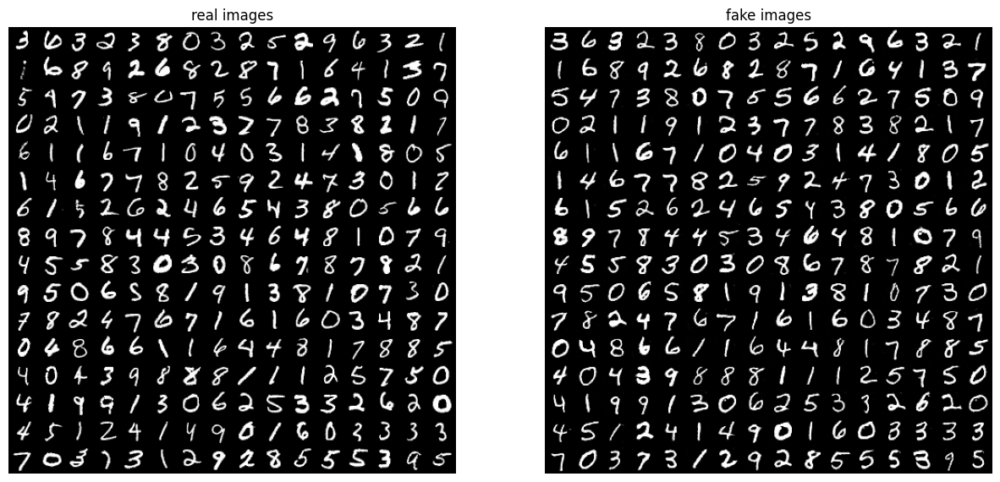

In [87]:
# Grab a batch of real images from the test dataset
real_images, real_targets = test_datas[0]

# generate the fake images from the same classes as the real images
with torch.no_grad():
    noises = torch.randn(
        real_targets.size(0), *Generator.INPUT_NOISE_DIMS, device=device)
    # *0.7 noises => more clean generation
    viz_fakeImages = netG(noises*0.7, real_targets.to(device)).detach()

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
showImagesPan(real_images, "real images", show=False)

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
showImagesPan(viz_fakeImages, "fake images", show=False)
plt.show()

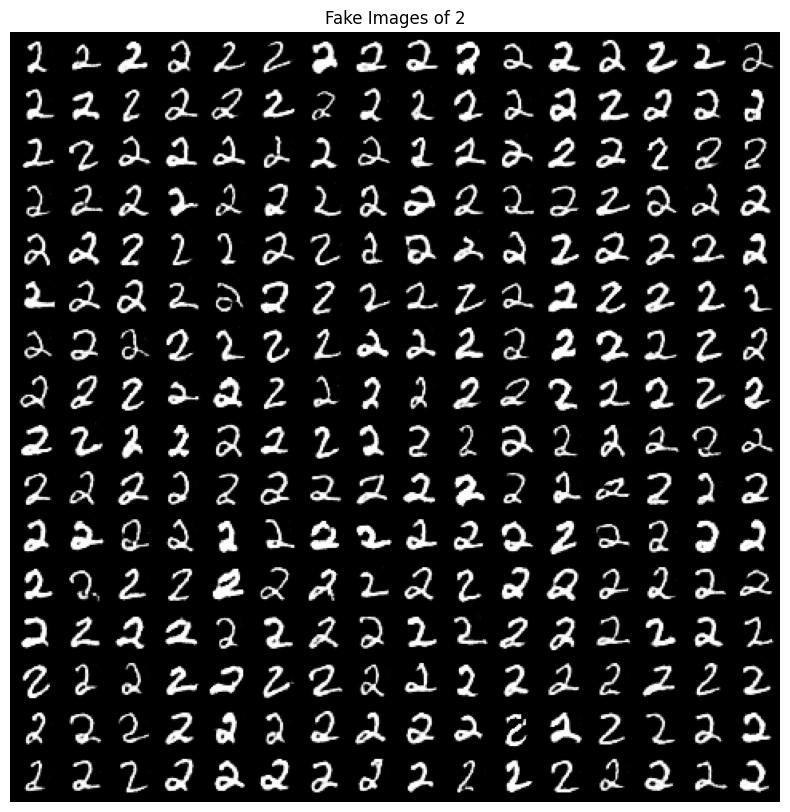

In [88]:
# generate the fake images from the same classe
targetedClass: int = 2
targets = torch.zeros((256, Generator.NB_CLASSES), device=device); targets[:, targetedClass] = 1.0
noises = torch.randn(targets.size(0), *Generator.INPUT_NOISE_DIMS, device=device) * 0.7

with torch.no_grad():
    viz_fakeImages = netG(noises, targets).detach()

# Plot the fake images
plt.figure(figsize=(10,10))
showImagesPan(viz_fakeImages, f"Fake Images of {targetedClass}")

Les questions ci-dessous sont pour vous guider et pour aller plus loin. Elles peuvent prendre beaucoup de temps, notamment à cause de l'entraînement. Il n'est pas attendu que vous y ayez répondu dans votre rendu moodle (Questions Bonus).

**Q1**: Lancer l'entraînement, et regarder si ça marche. Comprendre le code, et vous l'approprier.

> avant de remplacer par mon code, j'ai testé et les resultats étais "satisfaisants" mais sans controle possible sur une classe cible

**Q2**: Remplacez le discriminator par un réseau utilisant des couches convolutionnelles, comme à l'exercice 2. Arrivez-vous à reproduire l'expérience ?

> j'ai décidé de tout refaire a partir de generateur/discriminateur qui prenent en compte la classe <br>
> ca utilise des couches convolutionnelles pour les deux parties et cela ameliore grandement les resultats <br>
> et surtout on peux cibler ce que l'on génere et en avoir le control complet. <br>
> pour encore plus de control, on pourais demander au discriminateur de prédire le noise qui a servi a generer l'image, avec une loss sur la diff entre les images.
